In [78]:
import numpy as np
import matplotlib.pyplot as plt
import torch

from scipy.fftpack import fftshift 
from scipy.fft import fft2
from scipy.fft import fftn
 
%matplotlib inline

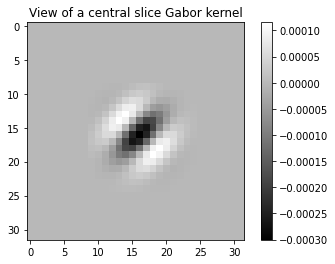

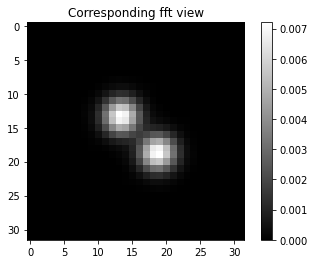

In [115]:
def gaborKern3D(N_dict, sigma_dict, u_dict):
    
    #Getting the x, y , z params
    #necessary to build the kernel
    N_x = N_dict['x']
    N_y = N_dict['y']
    N_z = N_dict['z']
    
    sigma_x = sigma_dict['x']
    sigma_y = sigma_dict['y']
    sigma_z = sigma_dict['z']
    
    u_x = u_dict['x']
    u_y = u_dict['y']
    u_z = u_dict['z']
    
    
    final_gabor = torch.zeros( 2*N_x, 2*N_y, 2*N_z)
    
    i = torch.linspace(-N_x/2 + 1, N_x/2, steps=N_x, dtype=int)
    j = torch.linspace(-N_y/2 + 1, N_y/2, steps=N_y, dtype=int)
    k = torch.linspace(-N_z/2 + 1, N_z/2, steps=N_z, dtype=int)
    
    X, Y, Z = torch.meshgrid( i, j, k)
    
    gaussian = torch.exp(-(X**2 + Y**2 + Z**2) /
                        (2 * sigma_x * sigma_y * sigma_z))
    
    gaussian /= torch.sum(gaussian)
    
    
    #The image needs to be in the central part of the matrix
    start_x = int(N_x/2 +1)
    stop_x = int(3* (N_x/2) +1)
    
    start_y = int(N_y/2 + 1)
    stop_y = int(3* (N_y/2) + 1)

    start_z = int(N_z/2 + 1)
    stop_z = int(3* (N_z/2) + 1)

    
    
    #modulating by the cosine
    gabor = gaussian * torch.cos( 2 * np.pi / 
                                 (N_x + N_y + N_z)*(u_x * X + u_y * Y + u_z * Z)) 
    
    
    final_gabor[start_x:stop_x,
                  start_y:stop_y,
                  start_z:stop_z] = gabor
    
    
    #Zero phase
    #g = fftshift(g)

    return final_gabor


N_dict = {}
sigma_dict = {}
u_dict = {}

N_x = 16
N_y = 16
N_z = 16

u_x = 4.0
u_y = 4.0
u_z = 4.0

sigma_x = 2.0
sigma_y = 2.0
sigma_z = 2.0

N_dict['x'] = N_x
N_dict['y'] = N_y
N_dict['z'] = N_z

sigma_dict['x'] = sigma_x
sigma_dict['y'] = sigma_y
sigma_dict['z'] = sigma_z

u_dict['x'] = u_x
u_dict['y'] = u_y
u_dict['z'] = u_z


final_gabor = gaborKern3D(N_dict, sigma_dict, u_dict)

plt.title("View of a central slice Gabor kernel")
plt.imshow(final_gabor[:,:, 10], cmap='gray')
plt.colorbar()
plt.show()

#FFT display
final_gabor_np = final_gabor.numpy()
plt.title("Corresponding fft view")
plt.imshow(fftshift(np.log(1+np.absolute(fft2(final_gabor_np[:,:, 10])))), cmap='gray')
plt.colorbar()
plt.show()

In [112]:
import plotly.graph_objects as go

#3D visualization
i = torch.linspace(0, 2 * N_x, steps=2*N_x, dtype=int)
j = torch.linspace(0, 2 * N_y, steps=2*N_y, dtype=int)
k = torch.linspace(0, 2 * N_z, steps=2*N_z, dtype=int)

X, Y, Z = torch.meshgrid( i, j, k)

fig = go.Figure(data=go.Isosurface(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    value=final_gabor.flatten(),
    isomin=0,
    isomax=0.0001,
    #surface_fill=0.4,
    caps=dict(x_show=False, y_show=False),
    #slices_z=dict(show=True, locations=[-1, -3,]),
    #slices_y=dict(show=True, locations=[0]),
    ))
fig.show()



In [113]:
#FFT vizualization
X_np = X.numpy()
Y_np = Y.numpy()
Z_np = Z.numpy()

fft_final_gabor_np = fftshift(np.log(1+np.absolute(fftn(final_gabor_np))))
#fft_final_gabor_np = fftshift((np.absolute(fftn(final_gabor_np))))

fig = go.Figure(data=go.Isosurface(
    x=X_np.flatten(),
    y=Y_np.flatten(),
    z=Z_np.flatten(),
    value=fft_final_gabor_np.flatten(),
    isomin=0,
    isomax=0.3,
    #surface_fill=0.4,
    caps=dict(x_show=False, y_show=False),
    #slices_z=dict(show=True, locations=[-1, -3,]),
    #slices_y=dict(show=True, locations=[0]),
    ))
fig.show()


In [163]:
#We can then make a very gabor filter bank (no rotation)
#by changing the central frequencies
all_freq = [float(x) for x in range(2,14,2)]
all_sig = [x/10 for x in range(20,8,-2)]
filter_list = []

for numb_f, freq in enumerate(all_freq):
    for numb_s, sig in enumerate(all_sig):
        u_dict['x'] = freq
        u_dict['y'] = freq
        u_dict['z'] = freq

        sigma_dict['x'] = sig
        sigma_dict['y'] = sig
        sigma_dict['z'] = sig

        tmp_gabor = gaborKern3D(N_dict, sigma_dict, u_dict)
        tmp_gabor_np = tmp_gabor.numpy()

        filter_list.append(tmp_gabor_np)

        if numb_f == 0 and numb_s==0:
            filter_bank = tmp_gabor_np.copy()
        else:
            filter_bank += tmp_gabor_np
 

In [164]:
#3D vizualization of the filterbank
fig = go.Figure(data=go.Isosurface(
    x=X_np.flatten(),
    y=Y_np.flatten(),
    z=Z_np.flatten(),
    value=filter_bank.flatten(),
    isomin=0,
    isomax=0.005,
    #surface_fill=0.01,
    caps=dict(x_show=False, y_show=False),
    #slices_z=dict(show=True, locations=[-1, -3,]),
    #slices_y=dict(show=True, locations=[0]),
    ))
fig.show()


In [166]:
#3D vizualization of the fourier domain

fft_filter_bank = fftshift(np.log(1+np.absolute(fftn(filter_bank))))
#fft_final_gabor_np = fftshift((np.absolute(fftn(final_gabor_np))))

fig = go.Figure(data=go.Isosurface(
    x=X_np.flatten(),
    y=Y_np.flatten(),
    z=Z_np.flatten(),
    value=fft_filter_bank.flatten(),
    isomin=0,
    isomax=0.4,
    #surface_fill=0.4,
    caps=dict(x_show=False, y_show=False),
    #slices_z=dict(show=True, locations=[-1, -3,]),
    #slices_y=dict(show=True, locations=[0]),
    ))
fig.show()
